In [1]:
import os 
import pathlib 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg
import random
import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Activation, Conv2D, MaxPool2D, Flatten, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow import keras
from keras import regularizers
from sklearn.metrics import classification_report,confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data Augmentation

In [2]:
# Directory paths
train_dir = "C:\\Users\\MUBASHIR MOHSIN\\OneDrive\\Datasets\\FaceMask_detection\\Train"
test_dir = "C:\\Users\\MUBASHIR MOHSIN\\OneDrive\\Datasets\\FaceMask_detection\\Test"
val_dir = "C:\\Users\\MUBASHIR MOHSIN\\OneDrive\\Datasets\\FaceMask_detection\\Validation"

In [3]:
# Augmentation settings
batch_size = 32
target_size = (180, 180)

In [4]:

# Create a data generator with augmentations for training data
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=(0.8, 1.2),
    zoom_range=0.2
)

# Load and augment training data
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical',  # or 'binary' depending on your setup
    shuffle=True
)

# Create a data generator for test and validation data (no augmentation)
test_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical'  # or 'binary'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical'  # or 'binary'
)

Found 2400 images belonging to 3 classes.
Found 1140 images belonging to 3 classes.
Found 390 images belonging to 3 classes.


# View Dataset

In [5]:
def view_images(target_dir, target_class, num_images, rows, cols, target_size):
    target_folder = os.path.join(target_dir, target_class)
    all_images = os.listdir(target_folder)
    random_images = random.sample(all_images, num_images)

    plt.figure(figsize=(18, 10))

    for i, image_name in enumerate(random_images, start=1):
        img_path = os.path.join(target_folder, image_name)
        img = cv2.imread(img_path)
        img = cv2.resize(img, (target_size, target_size))  # Resize to square

        plt.subplot(rows, cols, i)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert from BGR to RGB
        plt.title(target_class)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

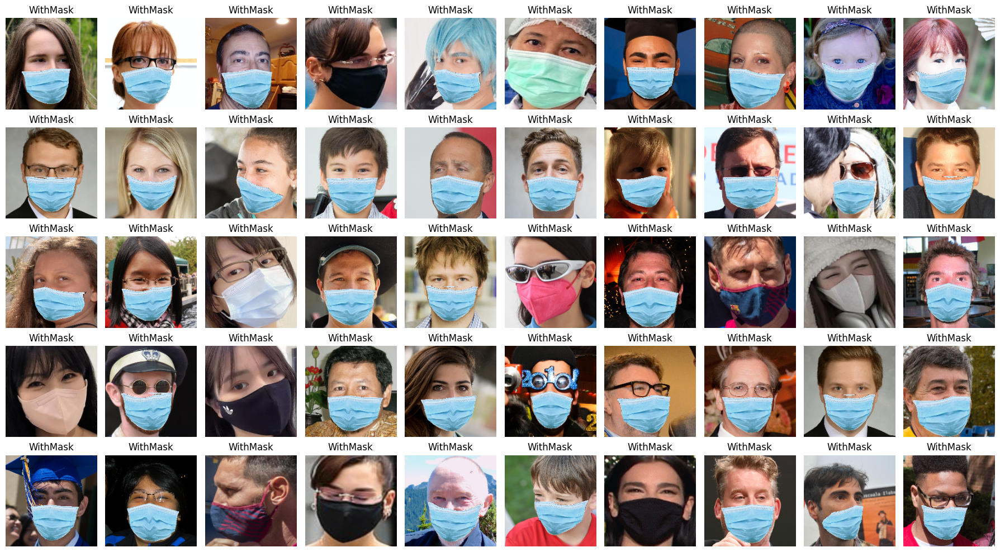

In [6]:
# Usage example
view_images(train_dir, "WithMask", num_images=50, rows=5, cols=10, target_size=180)

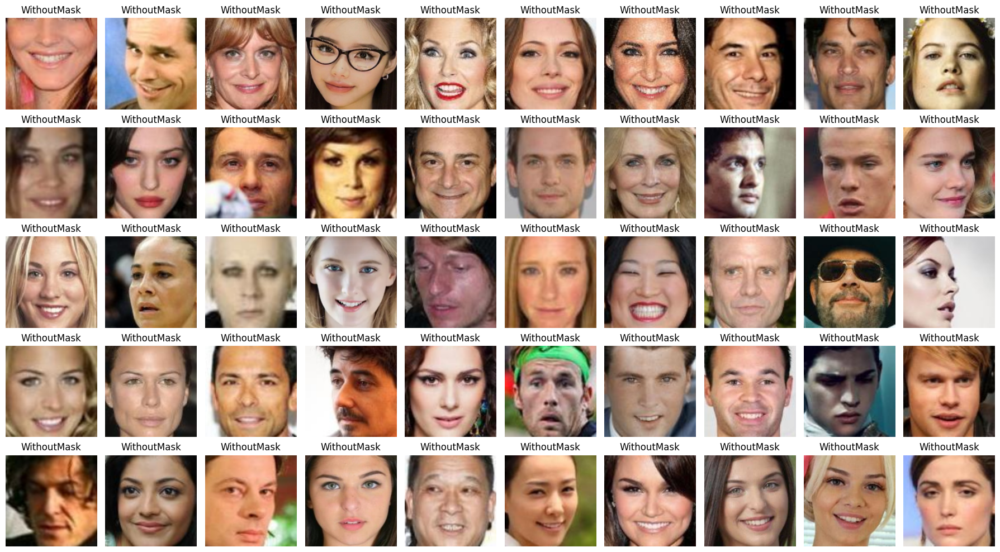

In [7]:
# Usage example
view_images(train_dir, "WithoutMask", num_images=50, rows=5, cols=10, target_size=180)

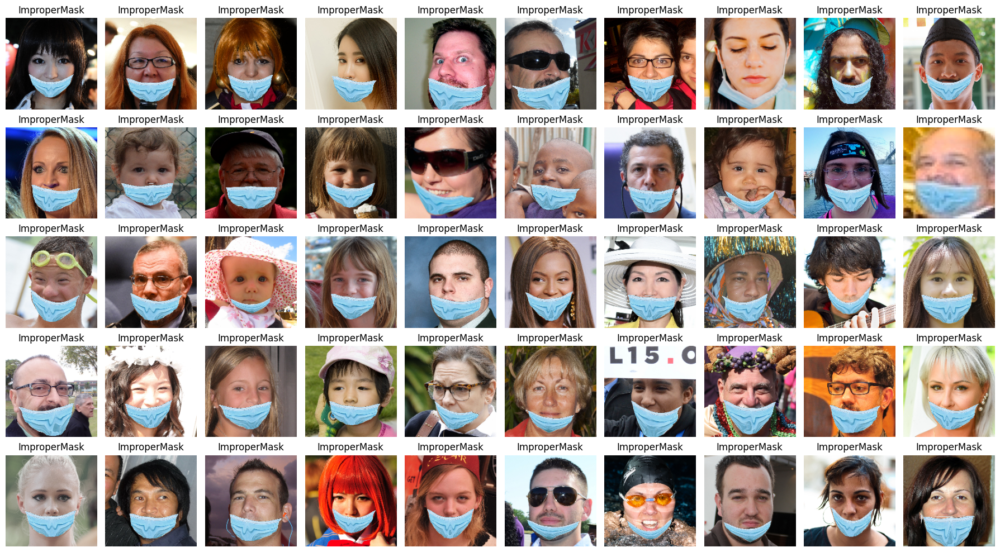

In [8]:
# Usage example
view_images(train_dir, "ImproperMask", num_images=50, rows=5, cols=10, target_size=180)

# Labeling Image Data for Model Building

###### Train Data

In [9]:
import os
import cv2
import random
import numpy as np

train_data = []
train_labels = []

with_mask_dir = os.path.join(train_dir, "WithMask")
without_mask_dir = os.path.join(train_dir, "WithoutMask")
improper_mask_dir = os.path.join(train_dir, "ImproperMask")

# Load images with masks
for a in os.listdir(improper_mask_dir):
    image = cv2.imread(os.path.join(improper_mask_dir, a))
    image = cv2.resize(image, (224, 224))
    train_data.append(image)
    train_labels.append(2)  # ImproperMask class is assigned label 1
    
# Load images with masks
for a in os.listdir(with_mask_dir):
    image = cv2.imread(os.path.join(with_mask_dir, a))
    image = cv2.resize(image, (224, 224))
    train_data.append(image)
    train_labels.append(1)  # WithMask class is assigned label 1

# Load images without masks
for a in os.listdir(without_mask_dir):
    image = cv2.imread(os.path.join(without_mask_dir, a))
    image = cv2.resize(image, (224, 224))
    train_data.append(image)
    train_labels.append(0)  # WithoutMask class is assigned label 0

In [10]:
# Convert to numpy arrays and normalize data
train_data = np.array(train_data) / 255.0
train_labels = np.array(train_labels)

print(f"Train Data Shape\t: {train_data.shape}")
print(f"Train Label Shape\t: {train_labels.shape}")

Train Data Shape	: (2400, 224, 224, 3)
Train Label Shape	: (2400,)


###### Test Data

In [11]:
test_data = []
test_labels = []

with_mask_dir = os.path.join(test_dir, "WithMask")
without_mask_dir = os.path.join(test_dir, "WithoutMask")
improper_mask_dir = os.path.join(test_dir, "ImproperMask")

# Load images with masks
for a in os.listdir(improper_mask_dir):
    image = cv2.imread(os.path.join(improper_mask_dir, a))
    image = cv2.resize(image, (224, 224))
    test_data.append(image)
    test_labels.append(2)  # ImproperMask class is assigned label 1
    
# Load images with masks
for a in os.listdir(with_mask_dir):
    image = cv2.imread(os.path.join(with_mask_dir, a))
    image = cv2.resize(image, (224, 224))
    test_data.append(image)
    test_labels.append(1)  # WithMask class is assigned label 1

# Load images without masks
for a in os.listdir(without_mask_dir):
    image = cv2.imread(os.path.join(without_mask_dir, a))
    image = cv2.resize(image, (224, 224))
    test_data.append(image)
    test_labels.append(0)  # WithoutMask class is assigned label 0

In [12]:
# Convert to numpy arrays and normalize data
test_data = np.array(test_data) / 255.0
test_labels = np.array(test_labels)

print(f"Test Data Shape \t: {test_data.shape}")
print(f"Test Label Shape\t: {test_labels.shape}")

Test Data Shape 	: (1140, 224, 224, 3)
Test Label Shape	: (1140,)


###### Validation Data

In [13]:
val_data = []
val_labels = []

with_mask_dir = os.path.join(val_dir, "WithMask")
without_mask_dir = os.path.join(val_dir, "WithoutMask")
improper_mask_dir = os.path.join(val_dir, "ImproperMask")

# Load images with masks
for a in os.listdir(improper_mask_dir):
    image = cv2.imread(os.path.join(improper_mask_dir, a))
    image = cv2.resize(image, (224, 224))
    val_data.append(image)
    val_labels.append(2)  # ImproperMask class is assigned label 1
    
# Load images with masks
for a in os.listdir(with_mask_dir):
    image = cv2.imread(os.path.join(with_mask_dir, a))
    image = cv2.resize(image, (224, 224))
    val_data.append(image)
    val_labels.append(1)  # WithMask class is assigned label 1

# Load images without masks
for a in os.listdir(without_mask_dir):
    image = cv2.imread(os.path.join(without_mask_dir, a))
    image = cv2.resize(image, (224, 224))
    val_data.append(image)
    val_labels.append(0)  # WithoutMask class is assigned label 0

In [14]:
# Convert to numpy arrays and normalize data
val_data = np.array(val_data) / 255.0
val_labels = np.array(val_labels)

print(f"Validation Data Shape \t: {val_data.shape}")
print(f"Validation Label Shape\t: {val_labels.shape}")

Validation Data Shape 	: (390, 224, 224, 3)
Validation Label Shape	: (390,)


### Data Summary
<pre>
Train Images      = 2400 
Test Images       = 1140
Validation Images = 390 
</pre>

# Model Building

##### Define Train and Test data for model

In [15]:
X_train, y_train = (train_data, train_labels)
X_test, y_test = (test_data, test_labels)
X_val, y_val = (val_data, val_labels)

### Building MobileNet

In [16]:
num_classes = 3  # Number of classes: WithMask, WithoutMask, ImproperMask

# Load MobileNet model with pre-trained weights
base_model = tf.keras.applications.MobileNet(
    input_shape = [224,224,3], 
    weights = "imagenet", 
    include_top = False
)

# Freeze the base model's layers
base_model.trainable = False

# Create your custom classification head
x = Flatten()(base_model.output)
x = Dense(units=256, activation="relu")(x)
x = Dense(units=64, activation="relu")(x)
# Use softmax for multi-class classification
prediction_layer = Dense(units=num_classes, activation="softmax")(x)  

# Combine the base http://localhost:8888/notebooks/OneDrive%20-%20American%20International%20University-Bangladesh/MAJOR/Computer%20Vision/Course/CVPR-Home-Tasks/FaceMask_Models.ipynb#model and custom classification head
model = Model(inputs=base_model.input, outputs=prediction_layer)

Compile the Model:

In [17]:
adam_lr = 0.00001
beta1 = 0.99
beta2 = 0.99
eps = 1e-9

optimizer_adam = keras.optimizers.Adam(learning_rate=adam_lr, beta_1=beta1, beta_2=beta2, epsilon=eps)

model.compile(
    optimizer = optimizer_adam, 
    loss = 'sparse_categorical_crossentropy', 
    metrics = ['accuracy']
)

Model Summary:

In [18]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32)     128       
 ation)                                                      

Early Stopping Function:

In [19]:
early_stopping = EarlyStopping(patience=5, restore_best_weights=True)

Train the Model:

In [20]:
h_mobileNet = model.fit(
    X_train, y_train,
    epochs = 10,
    validation_data = (X_val, y_val),
    batch_size = 32
)

Epoch 1/10
75/75 [==============================] - 18s 65ms/step - loss: 0.2477 - accuracy: 0.9050 - val_loss: 0.3819 - val_accuracy: 0.8436
Epoch 2/10
75/75 [==============================] - 2s 32ms/step - loss: 0.0273 - accuracy: 0.9900 - val_loss: 0.7734 - val_accuracy: 0.7795
Epoch 3/10
75/75 [==============================] - 2s 31ms/step - loss: 0.0063 - accuracy: 0.9979 - val_loss: 0.5559 - val_accuracy: 0.8308
Epoch 4/10
75/75 [==============================] - 2s 31ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 0.9146 - val_accuracy: 0.7718
Epoch 5/10
75/75 [==============================] - 2s 31ms/step - loss: 4.1534e-04 - accuracy: 1.0000 - val_loss: 0.7937 - val_accuracy: 0.8077
Epoch 6/10
75/75 [==============================] - 2s 31ms/step - loss: 1.2066e-04 - accuracy: 1.0000 - val_loss: 0.6344 - val_accuracy: 0.8308
Epoch 7/10
75/75 [==============================] - 2s 32ms/step - loss: 8.1679e-05 - accuracy: 1.0000 - val_loss: 0.5930 - val_accuracy: 0.8436


### Plotting Results - Accuracy vs Loss

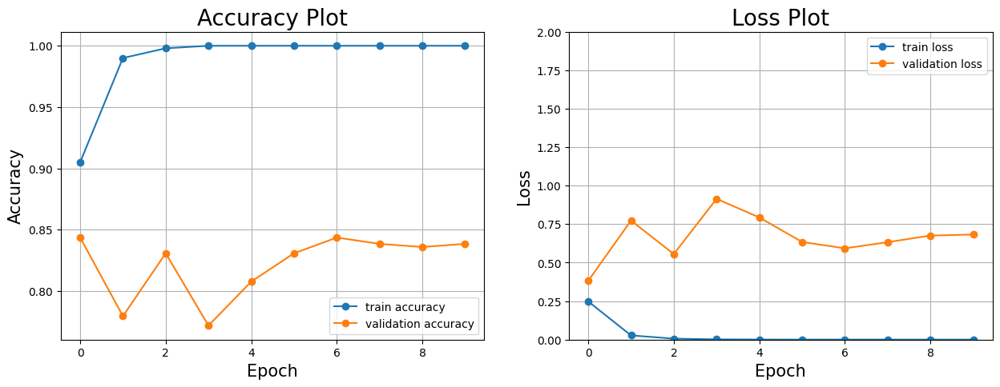

In [21]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.title("Accuracy Plot", size=20)
plt.plot(h_mobileNet.history['accuracy'], 'o-', label='train accuracy')
plt.plot(h_mobileNet.history['val_accuracy'], 'o-', label = 'validation accuracy')
plt.xlabel('Epoch', size=15)
plt.ylabel('Accuracy', size=15)
plt.grid(True)
plt.legend(loc='lower right')


plt.subplot(1,2,2)
plt.title("Loss Plot", size=20)
plt.plot(h_mobileNet.history['loss'], 'o-', label='train loss')
plt.plot(h_mobileNet.history['val_loss'], 'o-', label='validation loss')
plt.xlabel('Epoch', size=15)
plt.ylabel('Loss', size=15)
plt.ylim([0, 2])
plt.grid(True)
plt.legend(loc='upper right')
plt.show()

### Make Predictions

In [22]:
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from tabulate import tabulate

# Predict classes
predictions = model.predict(X_test)
predicted_classes = np.argmax(predictions, axis=1)  # Convert softmax probabilities to class labels

# Calculate accuracy
accuracy = accuracy_score(y_test, predicted_classes)
print(f"Accuracy: {accuracy:.2f}")

# Generate confusion matrix
confusion = confusion_matrix(y_test, predicted_classes)

# Create a DataFrame to format the confusion matrix
confusion_df = pd.DataFrame(
    confusion, index = ["WithoutMask", "WithMask", "ImproperMask"], 
    columns = ["WithoutMask", "WithMask", "ImproperMask"]
)

# Convert DataFrame to tabulated format
tabulated_confusion = tabulate(confusion_df, headers='keys', tablefmt='pretty')

# Print the formatted confusion matrix
print("Confusion Matrix:")
print(tabulated_confusion)

# Generate classification report
class_names = ["WithMask", "WithoutMask", "ImproperMask"]
report = classification_report(y_test, predicted_classes, target_names=class_names)

# Display classification report
print("\nClassification Report:")
print(report)

Accuracy: 0.99
Confusion Matrix:
+--------------+-------------+----------+--------------+
|              | WithoutMask | WithMask | ImproperMask |
+--------------+-------------+----------+--------------+
| WithoutMask  |     380     |    0     |      0       |
|   WithMask   |      0      |   377    |      3       |
| ImproperMask |      0      |    9     |     371      |
+--------------+-------------+----------+--------------+

Classification Report:
              precision    recall  f1-score   support

    WithMask       1.00      1.00      1.00       380
 WithoutMask       0.98      0.99      0.98       380
ImproperMask       0.99      0.98      0.98       380

    accuracy                           0.99      1140
   macro avg       0.99      0.99      0.99      1140
weighted avg       0.99      0.99      0.99      1140



Save the Model for Testing on WebCam

In [24]:
model_name = "mask_model_mobileNet.h5"
tf.keras.models.save_model(model, model_name)